In [1]:
import xarray as xr
from tqdm import tqdm
import numpy as np
from joblib import Parallel, delayed
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import os 
import pickle
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader
from shapely.ops import unary_union
from shapely.geometry import Point
import seaborn as sns

In [2]:
directory = "/work/sds-lab/Diyali/NASA_storm/Code_Output/GPM+Precip_Data/Merged/"
print(os.path.exists(directory))  # Check if the directory exists

True


In [3]:
file_path = os.path.join(directory, "Merged_GPM_precip_IMERGDFv07_1998010120240731.nc")
print(f"File path: {file_path}")

File path: /work/sds-lab/Diyali/NASA_storm/Code_Output/GPM+Precip_Data/Merged/Merged_GPM_precip_IMERGDFv07_1998010120240731.nc


In [4]:
# Open the NetCDF file
dataset = xr.open_dataset(file_path ,engine='netcdf4')

# Print all variables in the file
print("Variables in the file:")
print(dataset.variables)

# Extract and print the time range
time_values = dataset['time'].values
print(f"Time range: {time_values[0]} to {time_values[-1]}")

# Close the dataset
dataset.close()

Variables in the file:
Frozen({'time': <xarray.IndexVariable 'time' (time: 9709)> Size: 78kB
array(['1998-01-01T00:00:00.000000000', '1998-01-02T00:00:00.000000000',
       '1998-01-03T00:00:00.000000000', ..., '2024-07-29T00:00:00.000000000',
       '2024-07-30T00:00:00.000000000', '2024-07-31T00:00:00.000000000'],
      shape=(9709,), dtype='datetime64[ns]'), 'lat': <xarray.IndexVariable 'lat' (lat: 59)> Size: 236B
array([31.85, 31.95, 32.05, 32.15, 32.25, 32.35, 32.45, 32.55, 32.65, 32.75,
       32.85, 32.95, 33.05, 33.15, 33.25, 33.35, 33.45, 33.55, 33.65, 33.75,
       33.85, 33.95, 34.05, 34.15, 34.25, 34.35, 34.45, 34.55, 34.65, 34.75,
       34.85, 34.95, 35.05, 35.15, 35.25, 35.35, 35.45, 35.55, 35.65, 35.75,
       35.85, 35.95, 36.05, 36.15, 36.25, 36.35, 36.45, 36.55, 36.65, 36.75,
       36.85, 36.95, 37.05, 37.15, 37.25, 37.35, 37.45, 37.55, 37.65],
      dtype=float32), 'lon': <xarray.IndexVariable 'lon' (lon: 99)> Size: 396B
array([-85.35, -85.25, -85.15, -85.05, -84.9

In [5]:
# Extract the precipitation data
precipitation = dataset['precipitation']  

# Inspect the dimensions
print(precipitation.dims)  
print(precipitation.shape)  # (9709, 59, 99)

('time', 'lat', 'lon')
(9709, 59, 99)


In [14]:
def compute_rolling_window_percentiles(precipitation, percentile, file_path):
    # Define rolling window sizes (1-day to 10-day)
    window_sizes = range(1, 11)

    # Dictionary to store final percentile thresholds for each rolling window
    percentile_results = {}

    def process_grid_point(rolling_precip, lat_idx, lon_idx):
        grid_timeseries = rolling_precip[:, lat_idx, lon_idx].values  # Extract time series for grid point
        if not np.all(np.isnan(grid_timeseries)):  # Skip if all NaN
            return np.nanpercentile(grid_timeseries, percentile)  # Compute the specified percentile across all years
        return np.nan

    for window in tqdm(window_sizes, desc="Processing rolling windows"):
        # Compute rolling sum for precipitation (1-day to 10-day accumulated precipitation)
        rolling_precip = precipitation.rolling(time=window, center=False).sum()
        lat_size, lon_size = rolling_precip.shape[1], rolling_precip.shape[2]

        results = Parallel(n_jobs=-1, prefer="threads")(
            delayed(process_grid_point)(rolling_precip, lat_idx, lon_idx)
            for lat_idx in range(lat_size)
            for lon_idx in range(lon_size)
        )

        # Reshape the results back to a grid
        p_grid = np.array(results).reshape(lat_size, lon_size)

        # Store results for this rolling window
        percentile_results[window] = p_grid

        print(f"Computed {percentile}th percentile for {window}-day rolling sum across all years.")

    # Ensure the output directory exists
    output_dir = os.path.dirname(file_path)
    os.makedirs(output_dir, exist_ok=True)

    # Save the dictionary to a pickle file
    with open(file_path, "wb") as f:
        pickle.dump(percentile_results, f)

    print(f"{percentile}th percentile thresholds saved to {file_path}")

    # Load and print the saved keys to verify
    with open(file_path, "rb") as f:
        loaded_results = pickle.load(f)

    print("Saved keys in percentile_results:", list(loaded_results.keys()))

In [69]:
file_path_90 = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_90.pkl"
compute_rolling_window_percentiles(precipitation, 90, file_path_90)

Processing rolling windows:  10%|█         | 1/10 [00:09<01:24,  9.44s/it]

Computed 90th percentile for 1-day rolling sum across all years.


Processing rolling windows:  20%|██        | 2/10 [00:18<01:14,  9.34s/it]

Computed 90th percentile for 2-day rolling sum across all years.


Processing rolling windows:  30%|███       | 3/10 [00:27<01:04,  9.19s/it]

Computed 90th percentile for 3-day rolling sum across all years.


Processing rolling windows:  40%|████      | 4/10 [00:36<00:54,  9.13s/it]

Computed 90th percentile for 4-day rolling sum across all years.


Processing rolling windows:  50%|█████     | 5/10 [00:46<00:47,  9.42s/it]

Computed 90th percentile for 5-day rolling sum across all years.


Processing rolling windows:  60%|██████    | 6/10 [00:57<00:39,  9.77s/it]

Computed 90th percentile for 6-day rolling sum across all years.


Processing rolling windows:  70%|███████   | 7/10 [01:06<00:28,  9.67s/it]

Computed 90th percentile for 7-day rolling sum across all years.


Processing rolling windows:  80%|████████  | 8/10 [01:16<00:19,  9.68s/it]

Computed 90th percentile for 8-day rolling sum across all years.


Processing rolling windows:  90%|█████████ | 9/10 [01:25<00:09,  9.60s/it]

Computed 90th percentile for 9-day rolling sum across all years.


Processing rolling windows: 100%|██████████| 10/10 [01:36<00:00,  9.63s/it]

Computed 90th percentile for 10-day rolling sum across all years.
90th percentile thresholds saved to /work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_90.pkl
Saved keys in percentile_results: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [70]:
file_path_95 = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_95.pkl"
compute_rolling_window_percentiles(precipitation, 95, file_path_95)

Processing rolling windows:  10%|█         | 1/10 [00:10<01:31, 10.18s/it]

Computed 95th percentile for 1-day rolling sum across all years.


Processing rolling windows:  20%|██        | 2/10 [00:20<01:22, 10.37s/it]

Computed 95th percentile for 2-day rolling sum across all years.


Processing rolling windows:  30%|███       | 3/10 [00:31<01:13, 10.46s/it]

Computed 95th percentile for 3-day rolling sum across all years.


Processing rolling windows:  40%|████      | 4/10 [00:41<01:03, 10.55s/it]

Computed 95th percentile for 4-day rolling sum across all years.


Processing rolling windows:  50%|█████     | 5/10 [00:52<00:52, 10.56s/it]

Computed 95th percentile for 5-day rolling sum across all years.


Processing rolling windows:  60%|██████    | 6/10 [01:03<00:42, 10.64s/it]

Computed 95th percentile for 6-day rolling sum across all years.


Processing rolling windows:  70%|███████   | 7/10 [01:14<00:32, 10.69s/it]

Computed 95th percentile for 7-day rolling sum across all years.


Processing rolling windows:  80%|████████  | 8/10 [01:24<00:20, 10.50s/it]

Computed 95th percentile for 8-day rolling sum across all years.


Processing rolling windows:  90%|█████████ | 9/10 [01:35<00:10, 10.63s/it]

Computed 95th percentile for 9-day rolling sum across all years.


Processing rolling windows: 100%|██████████| 10/10 [01:46<00:00, 10.61s/it]

Computed 95th percentile for 10-day rolling sum across all years.
95th percentile thresholds saved to /work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_95.pkl
Saved keys in percentile_results: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [15]:
file_path_975 = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_97.5.pkl"
compute_rolling_window_percentiles(precipitation, 97.5, file_path_975)

Processing rolling windows:  10%|█         | 1/10 [00:05<00:52,  5.83s/it]

Computed 97.5th percentile for 1-day rolling sum across all years.


Processing rolling windows:  20%|██        | 2/10 [00:11<00:45,  5.73s/it]

Computed 97.5th percentile for 2-day rolling sum across all years.


Processing rolling windows:  30%|███       | 3/10 [00:17<00:39,  5.70s/it]

Computed 97.5th percentile for 3-day rolling sum across all years.


Processing rolling windows:  40%|████      | 4/10 [00:26<00:42,  7.05s/it]

Computed 97.5th percentile for 4-day rolling sum across all years.


Processing rolling windows:  50%|█████     | 5/10 [00:32<00:32,  6.59s/it]

Computed 97.5th percentile for 5-day rolling sum across all years.


Processing rolling windows:  60%|██████    | 6/10 [00:37<00:25,  6.31s/it]

Computed 97.5th percentile for 6-day rolling sum across all years.


Processing rolling windows:  70%|███████   | 7/10 [00:43<00:18,  6.14s/it]

Computed 97.5th percentile for 7-day rolling sum across all years.


Processing rolling windows:  80%|████████  | 8/10 [00:52<00:14,  7.12s/it]

Computed 97.5th percentile for 8-day rolling sum across all years.


Processing rolling windows:  90%|█████████ | 9/10 [01:02<00:07,  7.82s/it]

Computed 97.5th percentile for 9-day rolling sum across all years.


Processing rolling windows: 100%|██████████| 10/10 [01:09<00:00,  6.91s/it]

Computed 97.5th percentile for 10-day rolling sum across all years.
97.5th percentile thresholds saved to /work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_97.5.pkl
Saved keys in percentile_results: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [71]:
file_path_99 = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_99.pkl"
compute_rolling_window_percentiles(precipitation, 99, file_path_99)

Processing rolling windows:  10%|█         | 1/10 [00:10<01:31, 10.13s/it]

Computed 99th percentile for 1-day rolling sum across all years.


Processing rolling windows:  20%|██        | 2/10 [00:20<01:22, 10.34s/it]

Computed 99th percentile for 2-day rolling sum across all years.


Processing rolling windows:  30%|███       | 3/10 [00:31<01:12, 10.42s/it]

Computed 99th percentile for 3-day rolling sum across all years.


Processing rolling windows:  40%|████      | 4/10 [00:41<01:02, 10.46s/it]

Computed 99th percentile for 4-day rolling sum across all years.


Processing rolling windows:  50%|█████     | 5/10 [00:52<00:52, 10.57s/it]

Computed 99th percentile for 5-day rolling sum across all years.


Processing rolling windows:  60%|██████    | 6/10 [01:03<00:42, 10.65s/it]

Computed 99th percentile for 6-day rolling sum across all years.


Processing rolling windows:  70%|███████   | 7/10 [01:14<00:32, 10.70s/it]

Computed 99th percentile for 7-day rolling sum across all years.


Processing rolling windows:  80%|████████  | 8/10 [01:24<00:21, 10.73s/it]

Computed 99th percentile for 8-day rolling sum across all years.


Processing rolling windows:  90%|█████████ | 9/10 [01:35<00:10, 10.77s/it]

Computed 99th percentile for 9-day rolling sum across all years.


Processing rolling windows: 100%|██████████| 10/10 [01:46<00:00, 10.66s/it]

Computed 99th percentile for 10-day rolling sum across all years.
99th percentile thresholds saved to /work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_99.pkl
Saved keys in percentile_results: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [76]:
file_path_100 = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_100.pkl"
compute_rolling_window_percentiles(precipitation, 100, file_path_100)

Processing rolling windows:  10%|█         | 1/10 [00:10<01:32, 10.27s/it]

Computed 100th percentile for 1-day rolling sum across all years.


Processing rolling windows:  20%|██        | 2/10 [00:20<01:23, 10.39s/it]

Computed 100th percentile for 2-day rolling sum across all years.


Processing rolling windows:  30%|███       | 3/10 [00:31<01:13, 10.53s/it]

Computed 100th percentile for 3-day rolling sum across all years.


Processing rolling windows:  40%|████      | 4/10 [00:41<01:02, 10.48s/it]

Computed 100th percentile for 4-day rolling sum across all years.


Processing rolling windows:  50%|█████     | 5/10 [00:52<00:52, 10.53s/it]

Computed 100th percentile for 5-day rolling sum across all years.


Processing rolling windows:  60%|██████    | 6/10 [01:03<00:42, 10.64s/it]

Computed 100th percentile for 6-day rolling sum across all years.


Processing rolling windows:  70%|███████   | 7/10 [01:14<00:32, 10.70s/it]

Computed 100th percentile for 7-day rolling sum across all years.


Processing rolling windows:  80%|████████  | 8/10 [01:25<00:21, 10.76s/it]

Computed 100th percentile for 8-day rolling sum across all years.


Processing rolling windows:  90%|█████████ | 9/10 [01:35<00:10, 10.81s/it]

Computed 100th percentile for 9-day rolling sum across all years.


Processing rolling windows: 100%|██████████| 10/10 [01:45<00:00, 10.58s/it]

Computed 100th percentile for 10-day rolling sum across all years.
100th percentile thresholds saved to /work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_100.pkl
Saved keys in percentile_results: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [8]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
import pickle

def plot_rolling_window_percentiles(percentile_results, percentile_label, lat, lon, shapefile_path):
    # Load the shapefile using GeoPandas
    county_gdf = gpd.read_file(shapefile_path)

    # Define rolling window sizes
    window_sizes = range(1, 11)  # 1-day to 10-day windows

    # Create subplots: 5 rows × 2 columns 
    fig, axes = plt.subplots(5, 2, figsize=(16, 25), subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.flatten()  # Flatten axes for easy indexing

    # Find global min and max values for consistent color mapping across all subplots
    all_values = np.concatenate([percentile_results[window].flatten() for window in window_sizes])
    vmin, vmax = np.nanmin(all_values), np.nanmax(all_values)

    # Loop through each rolling window and plot the percentile data
    for i, window in enumerate(window_sizes):
        ax = axes[i]
        p_grid = percentile_results[window]  # Extract the percentile grid

        # Configure map boundaries
        ax.set_extent([lon.min(), lon.max(), lat.min(), lat.max()], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.add_feature(cfeature.LAND, edgecolor='black')
        ax.add_feature(cfeature.OCEAN, alpha=0.5)

        # Overlay county boundaries from the shapefile
        county_gdf.boundary.plot(ax=ax, edgecolor='black', linewidth=0.5, transform=ccrs.PlateCarree())

        # Plot with a fixed color scale
        c = ax.contourf(lon, lat, p_grid, 60, transform=ccrs.PlateCarree(), cmap='coolwarm', vmin=vmin, vmax=vmax)

        # Add title for each rolling window
        ax.set_title(f"{window}-Day Rolling {percentile_label} Percentile", fontsize=12)

    # Add a single colorbar for the entire figure
    cbar_ax = fig.add_axes([0.96, 0.15, 0.02, 0.7])  # Position colorbar to the right
    cbar = fig.colorbar(c, cax=cbar_ax, orientation="vertical")
    cbar.set_label(f"{percentile_label} Percentile (mm)", fontsize=12)

    # Hide any empty subplots if window_sizes < total subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

In [7]:
file_path_90 = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_90.pkl"
file_path_95 = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_95.pkl"
file_path_975 = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_97.5.pkl"
file_path_99 = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_99.pkl"
file_path_100 = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_100.pkl"
file_path_975_f = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_97.5_forward.pkl"

/tmp/ipykernel_47771/2589793676.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


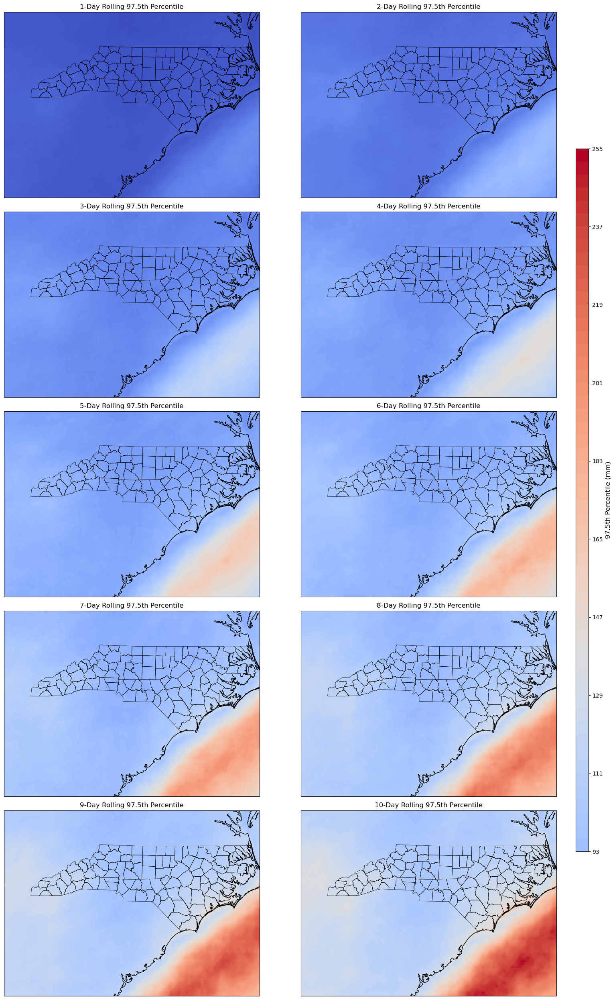

In [9]:
shapefile_path = "/work/sds-lab/Diyali/NASA_storm/shapefiles/NC_counties.shp"
lat = precipitation['lat'].values
lon = precipitation['lon'].values
with open(file_path_975_f, "rb") as f:
    percentile_results_975_f = pickle.load(f)
plot_rolling_window_percentiles(percentile_results_975_f, "97.5th",lat, lon, shapefile_path)

/tmp/ipykernel_285452/2589793676.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


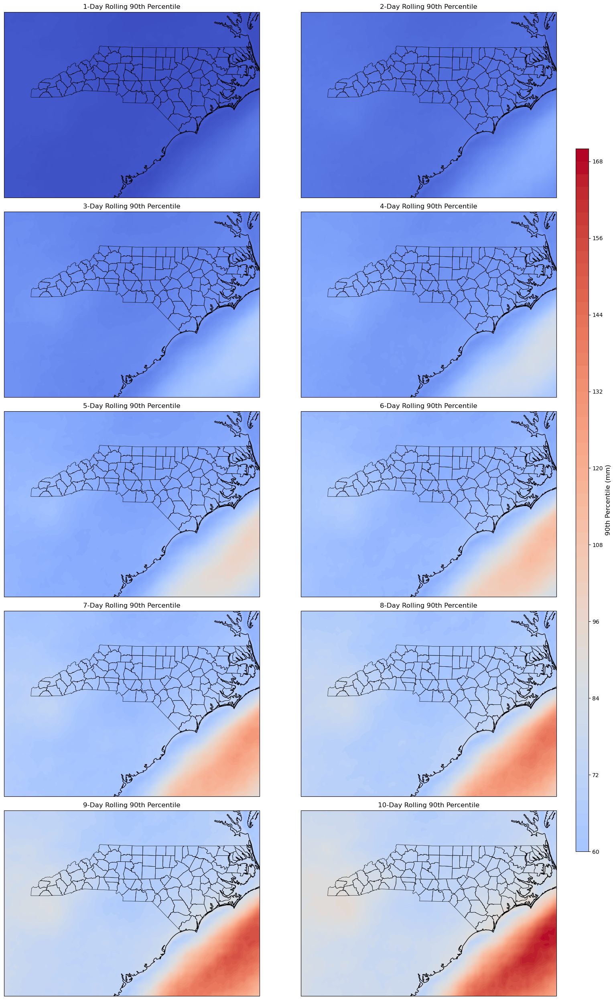

In [34]:
shapefile_path = "/work/sds-lab/Diyali/NASA_storm/shapefiles/NC_counties.shp"
lat = precipitation['lat'].values
lon = precipitation['lon'].values
with open(file_path_90, "rb") as f:
    percentile_results_90 = pickle.load(f)
plot_rolling_window_percentiles(percentile_results_90, "90th",lat, lon, shapefile_path)

/tmp/ipykernel_285452/2589793676.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


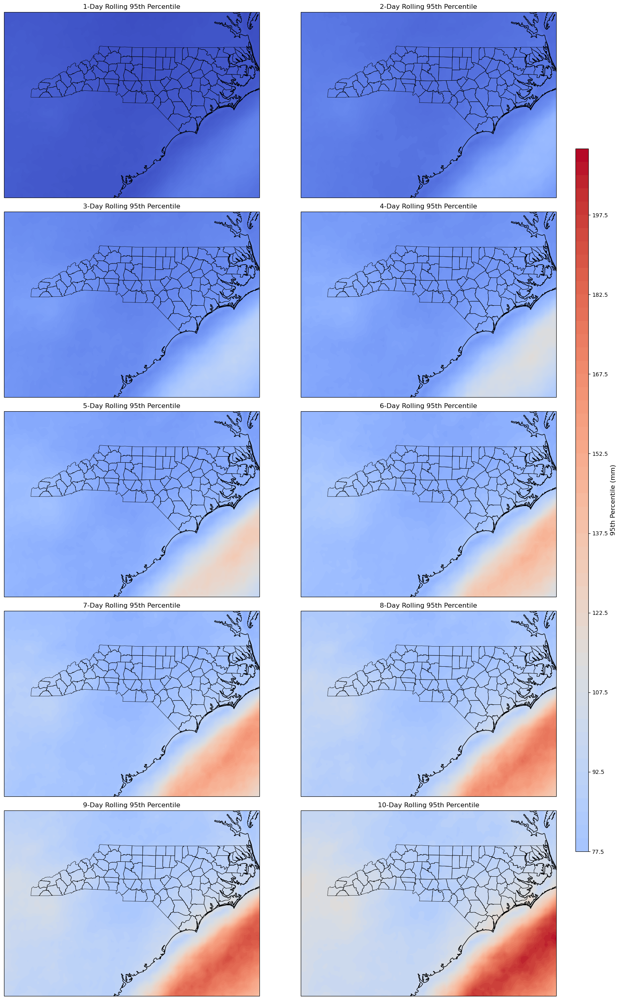

In [38]:
with open(file_path_95, "rb") as f:
    percentile_results_95 = pickle.load(f)
plot_rolling_window_percentiles(percentile_results_95,"95th", lat, lon, shapefile_path)

/tmp/ipykernel_285452/2589793676.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


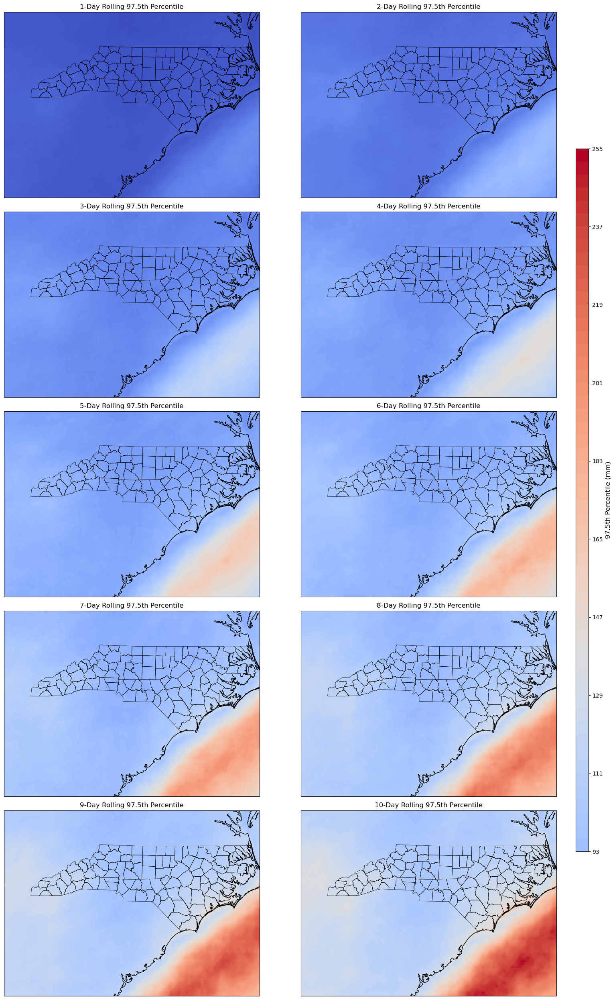

In [42]:
with open(file_path_975, "rb") as f:
    percentile_results_975 = pickle.load(f)
plot_rolling_window_percentiles(percentile_results_975,"97.5th", lat, lon, shapefile_path)

/tmp/ipykernel_285452/2589793676.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


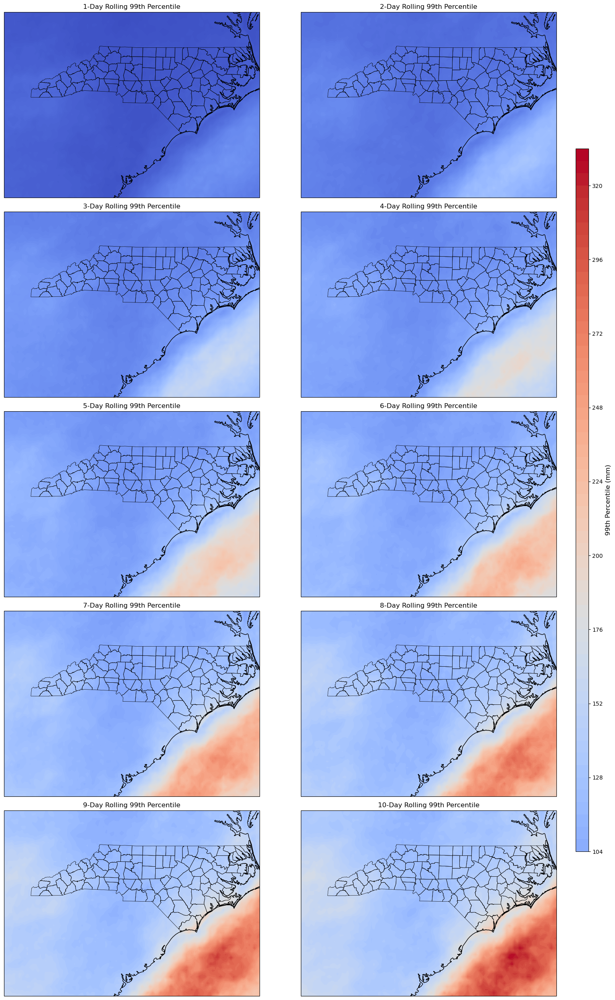

In [43]:
with open(file_path_99, "rb") as f:
    percentile_results_99 = pickle.load(f)
plot_rolling_window_percentiles(percentile_results_99, "99th", lat, lon, shapefile_path)

/tmp/ipykernel_285452/2589793676.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


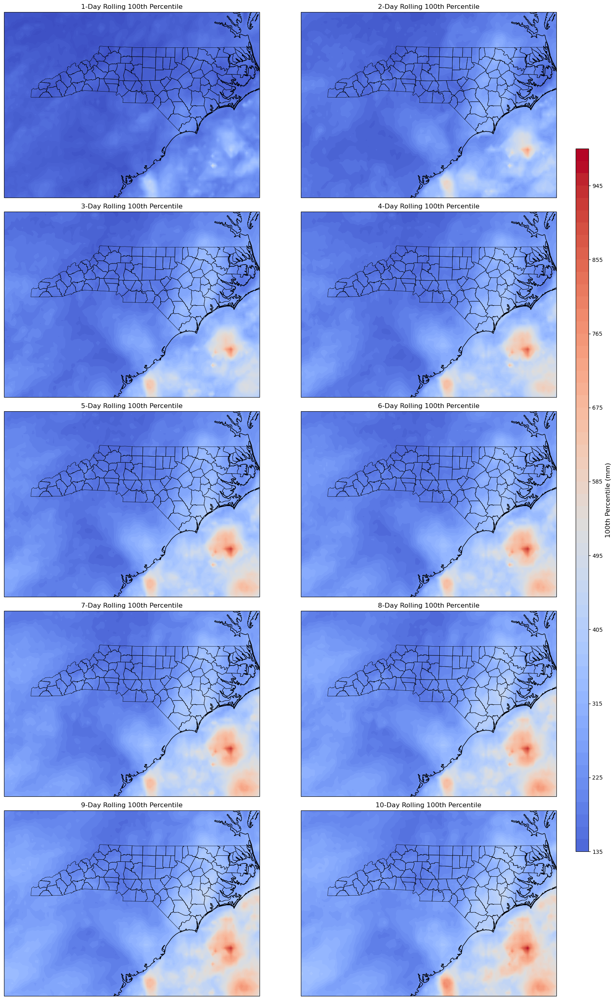

In [45]:
with open(file_path_100, "rb") as f:
    percentile_results_100 = pickle.load(f)
plot_rolling_window_percentiles(percentile_results_100, "100th", lat,lon, shapefile_path)

In [12]:
import pickle
import numpy as np
import geopandas as gpd

# File paths
percentile_file_path = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_95.pkl"
shapefile_path = "/work/sds-lab/Diyali/NASA_storm/shapefiles/NC_counties.shp"

# Load percentile results from the pickle file
with open(percentile_file_path, "rb") as f:
    percentile_results = pickle.load(f)

# Load NC county shapefile
county_gdf = gpd.read_file(shapefile_path)

# Extract lat/lon coordinates from one of the percentile grids
sample_grid = next(iter(percentile_results.values()))
lat_size, lon_size = sample_grid.shape  # Extract grid shape

# Compute the average 95th percentile for all grid points within North Carolina
average_percentiles = {}

for window, percentile_grid in percentile_results.items():
    # Compute the mean across all grid points (ignoring NaN values)
    average_percentile = np.nanmean(percentile_grid)
    average_percentiles[window] = average_percentile

# Convert results to a DataFrame for easy display
import pandas as pd
average_percentile_df = pd.DataFrame(list(average_percentiles.items()), columns=["Rolling Window (Days)", "Average 95th Percentile (mm)"])

In [13]:
average_percentile_df

,Rolling Window (Days),Average 95th Percentile (mm)
0,1,23.101980
1,2,38.593525
2,3,50.539822
3,4,60.703209
4,5,69.849930
5,6,78.329491
6,7,86.373215
7,8,94.078857
8,9,101.586800
9,10,108.902351


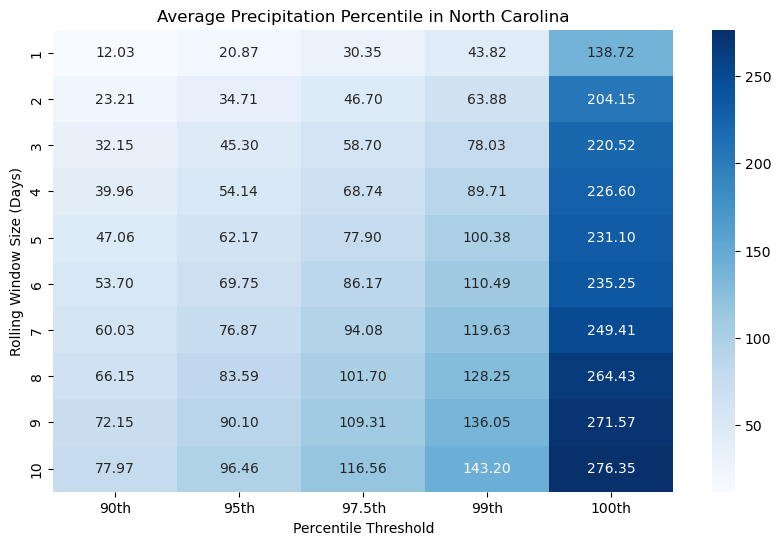

In [51]:
import seaborn as sns
import shapefile as shpreader

file_paths = {
    "90th": "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_90.pkl",
    "95th": "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_95.pkl",
    "97.5th": "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_97.5.pkl",
    "99th": "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_99.pkl",
    "100th": "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_100.pkl"
}

shapefile_path = "/work/sds-lab/Diyali/NASA_storm/shapefiles/NC_counties.shp"

# Load the NC shapefile
shape_reader = shpreader.Reader(shapefile_path)
county_gdf = gpd.read_file(shapefile_path)

lat = precipitation['lat'].values
lon = precipitation['lon'].values

# Function to check if a grid point falls within NC
def is_in_north_carolina(lat_point, lon_point):
    point = gpd.points_from_xy([lon_point], [lat_point])[0]
    return county_gdf.contains(point).any()

# Define rolling window sizes and percentiles
window_sizes = range(1, 11)
percentiles = ["90th", "95th", "97.5th", "99th", "100th"]
heatmap_data_forward = np.zeros((len(window_sizes), len(percentiles)))  # Store results

# Iterate over percentile files
for p_idx, (percentile_label, file_path) in enumerate(file_paths.items()):
    # Load the forward percentile results
    with open(file_path, "rb") as f:
        percentile_results = pickle.load(f)

    # Compute averages for each rolling window
    for w_idx, window in enumerate(window_sizes):
        p_grid = percentile_results[window]  # Get the percentile grid

        # Identify NC grid points and compute the average
        nc_values = []
        for i in range(len(lat)):
            for j in range(len(lon)):
                if is_in_north_carolina(lat[i], lon[j]):  # Check if grid point is in NC
                    nc_values.append(p_grid[i, j])

        # Compute the average for NC grid points
        heatmap_data_forward[w_idx, p_idx] = np.nanmean(nc_values)

# Create heatmap visualization for percentiles
plt.figure(figsize=(10, 6))
ax = sns.heatmap(heatmap_data_forward, annot=True, cmap="Blues", xticklabels=percentiles, yticklabels=window_sizes, fmt=".2f")

# Add labels
plt.xlabel("Percentile Threshold")
plt.ylabel("Rolling Window Size (Days)")
plt.title("Average Precipitation Percentile in North Carolina")

# Show the plot
plt.show()

## Rolling Sum percentile forward

In [8]:
import os
import pickle

def compute_forward_rolling_window_percentiles(precipitation, percentile, file_path):
    window_sizes = range(1, 11)

    # Dictionary to store final percentile thresholds for each rolling window
    percentile_results = {}

    def process_grid_point(rolling_precip, lat_idx, lon_idx):
        grid_timeseries = rolling_precip[:, lat_idx, lon_idx].values  # Extract time series for grid point
        if not np.all(np.isnan(grid_timeseries)):  # Skip if all NaN
            return np.nanpercentile(grid_timeseries, percentile)  # Compute the specified percentile across all years
        return np.nan

    for window in tqdm(window_sizes, desc="Processing forward-looking rolling windows"):
        # Compute forward-looking rolling sum for precipitation
        rolling_precip = precipitation.rolling(time=window, center=False).sum().shift(time=-(window-1))

        lat_size, lon_size = rolling_precip.shape[1], rolling_precip.shape[2]

        results = Parallel(n_jobs=-1, prefer="threads")(
            delayed(process_grid_point)(rolling_precip, lat_idx, lon_idx)
            for lat_idx in range(lat_size)
            for lon_idx in range(lon_size)
        )

        # Reshape the results back to a grid
        p_grid = np.array(results).reshape(lat_size, lon_size)

        # Store results for this rolling window
        percentile_results[window] = p_grid

        print(f"Computed {percentile}th percentile for {window}-day forward-looking rolling sum across all years.")

    # Ensure the output directory exists
    output_dir = os.path.dirname(file_path)
    os.makedirs(output_dir, exist_ok=True)

    # Save the dictionary to a pickle file
    with open(file_path, "wb") as f:
        pickle.dump(percentile_results, f)

    print(f"{percentile}th percentile thresholds saved to {file_path}")

    # Load and print the saved keys to verify
    with open(file_path, "rb") as f:
        loaded_results = pickle.load(f)

    print("Saved keys in percentile_results:", list(loaded_results.keys()))

In [9]:
file_path_90f = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_90_forward.pkl"
compute_forward_rolling_window_percentiles(precipitation, 90, file_path_90f)

Processing forward-looking rolling windows:  10%|█         | 1/10 [00:06<01:02,  6.98s/it]

Computed 90th percentile for 1-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  20%|██        | 2/10 [00:13<00:53,  6.75s/it]

Computed 90th percentile for 2-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  30%|███       | 3/10 [00:19<00:44,  6.39s/it]

Computed 90th percentile for 3-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  40%|████      | 4/10 [00:25<00:37,  6.17s/it]

Computed 90th percentile for 4-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  50%|█████     | 5/10 [00:31<00:30,  6.12s/it]

Computed 90th percentile for 5-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  60%|██████    | 6/10 [00:37<00:24,  6.14s/it]

Computed 90th percentile for 6-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  70%|███████   | 7/10 [00:43<00:18,  6.09s/it]

Computed 90th percentile for 7-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  80%|████████  | 8/10 [00:52<00:14,  7.05s/it]

Computed 90th percentile for 8-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  90%|█████████ | 9/10 [00:58<00:06,  6.73s/it]

Computed 90th percentile for 9-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows: 100%|██████████| 10/10 [01:04<00:00,  6.50s/it]

Computed 90th percentile for 10-day forward-looking rolling sum across all years.
90th percentile thresholds saved to /work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_90_forward.pkl
Saved keys in percentile_results: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [10]:
file_path_95f = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_95_forward.pkl"
compute_forward_rolling_window_percentiles(precipitation, 95, file_path_95f)

Processing forward-looking rolling windows:  10%|█         | 1/10 [00:06<00:54,  6.06s/it]

Computed 95th percentile for 1-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  20%|██        | 2/10 [00:12<00:52,  6.51s/it]

Computed 95th percentile for 2-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  30%|███       | 3/10 [00:19<00:45,  6.55s/it]

Computed 95th percentile for 3-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  40%|████      | 4/10 [00:26<00:40,  6.70s/it]

Computed 95th percentile for 4-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  50%|█████     | 5/10 [00:33<00:33,  6.77s/it]

Computed 95th percentile for 5-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  60%|██████    | 6/10 [00:39<00:26,  6.51s/it]

Computed 95th percentile for 6-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  70%|███████   | 7/10 [00:45<00:19,  6.34s/it]

Computed 95th percentile for 7-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  80%|████████  | 8/10 [00:51<00:12,  6.26s/it]

Computed 95th percentile for 8-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  90%|█████████ | 9/10 [00:57<00:06,  6.19s/it]

Computed 95th percentile for 9-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows: 100%|██████████| 10/10 [01:03<00:00,  6.37s/it]

Computed 95th percentile for 10-day forward-looking rolling sum across all years.
95th percentile thresholds saved to /work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_95_forward.pkl
Saved keys in percentile_results: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [11]:
file_path_975f = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_97.5_forward.pkl"
compute_forward_rolling_window_percentiles(precipitation, 97.5, file_path_975f)

Processing forward-looking rolling windows:  10%|█         | 1/10 [00:05<00:52,  5.86s/it]

Computed 97.5th percentile for 1-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  20%|██        | 2/10 [00:11<00:46,  5.82s/it]

Computed 97.5th percentile for 2-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  30%|███       | 3/10 [00:20<00:51,  7.40s/it]

Computed 97.5th percentile for 3-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  40%|████      | 4/10 [00:26<00:40,  6.78s/it]

Computed 97.5th percentile for 4-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  50%|█████     | 5/10 [00:33<00:33,  6.76s/it]

Computed 97.5th percentile for 5-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  60%|██████    | 6/10 [00:40<00:27,  6.80s/it]

Computed 97.5th percentile for 6-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  70%|███████   | 7/10 [00:47<00:20,  6.84s/it]

Computed 97.5th percentile for 7-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  80%|████████  | 8/10 [00:53<00:13,  6.57s/it]

Computed 97.5th percentile for 8-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  90%|█████████ | 9/10 [01:02<00:07,  7.45s/it]

Computed 97.5th percentile for 9-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows: 100%|██████████| 10/10 [01:12<00:00,  7.23s/it]

Computed 97.5th percentile for 10-day forward-looking rolling sum across all years.
97.5th percentile thresholds saved to /work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_97.5_forward.pkl
Saved keys in percentile_results: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [12]:
file_path_99f = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_99_forward.pkl"
compute_forward_rolling_window_percentiles(precipitation, 99, file_path_99f)

Processing forward-looking rolling windows:  10%|█         | 1/10 [00:05<00:53,  6.00s/it]

Computed 99th percentile for 1-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  20%|██        | 2/10 [00:11<00:47,  5.90s/it]

Computed 99th percentile for 2-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  30%|███       | 3/10 [00:18<00:42,  6.10s/it]

Computed 99th percentile for 3-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  40%|████      | 4/10 [00:24<00:36,  6.04s/it]

Computed 99th percentile for 4-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  50%|█████     | 5/10 [00:30<00:30,  6.00s/it]

Computed 99th percentile for 5-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  60%|██████    | 6/10 [00:36<00:23,  5.99s/it]

Computed 99th percentile for 6-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  70%|███████   | 7/10 [00:42<00:18,  6.00s/it]

Computed 99th percentile for 7-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  80%|████████  | 8/10 [00:48<00:12,  6.05s/it]

Computed 99th percentile for 8-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  90%|█████████ | 9/10 [00:54<00:06,  6.06s/it]

Computed 99th percentile for 9-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows: 100%|██████████| 10/10 [01:00<00:00,  6.05s/it]

Computed 99th percentile for 10-day forward-looking rolling sum across all years.
99th percentile thresholds saved to /work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_99_forward.pkl
Saved keys in percentile_results: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [13]:
file_path_100f = "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_100_forward.pkl"
compute_forward_rolling_window_percentiles(precipitation, 100, file_path_100f)

Processing forward-looking rolling windows:  10%|█         | 1/10 [00:05<00:53,  5.92s/it]

Computed 100th percentile for 1-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  20%|██        | 2/10 [00:11<00:47,  5.88s/it]

Computed 100th percentile for 2-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  30%|███       | 3/10 [00:17<00:41,  5.91s/it]

Computed 100th percentile for 3-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  40%|████      | 4/10 [00:23<00:35,  5.94s/it]

Computed 100th percentile for 4-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  50%|█████     | 5/10 [00:29<00:29,  5.94s/it]

Computed 100th percentile for 5-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  60%|██████    | 6/10 [00:35<00:23,  5.97s/it]

Computed 100th percentile for 6-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  70%|███████   | 7/10 [00:41<00:18,  6.01s/it]

Computed 100th percentile for 7-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  80%|████████  | 8/10 [00:47<00:12,  6.01s/it]

Computed 100th percentile for 8-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows:  90%|█████████ | 9/10 [00:54<00:06,  6.09s/it]

Computed 100th percentile for 9-day forward-looking rolling sum across all years.


Processing forward-looking rolling windows: 100%|██████████| 10/10 [01:00<00:00,  6.04s/it]

Computed 100th percentile for 10-day forward-looking rolling sum across all years.
100th percentile thresholds saved to /work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_100_forward.pkl
Saved keys in percentile_results: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


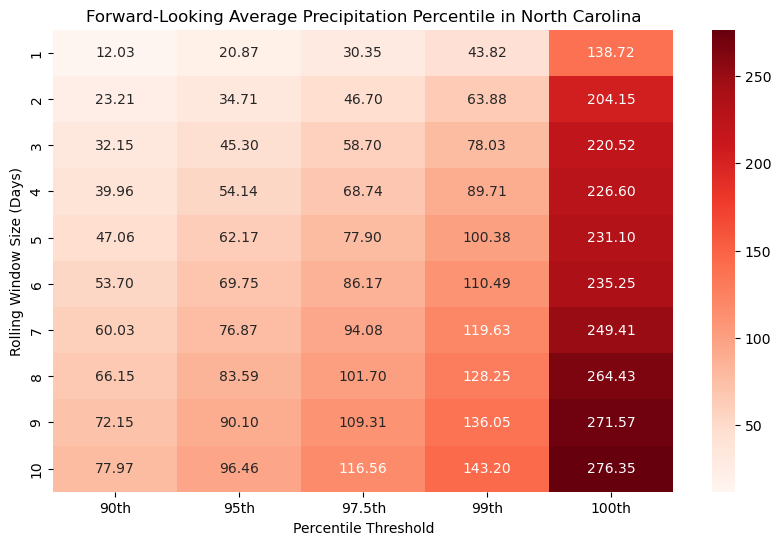

In [21]:
import seaborn as sns
import shapefile as shpreader

forward_file_paths = {
    "90th": "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_90_forward.pkl",
    "95th": "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_95_forward.pkl",
    "97.5th": "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_97.5_forward.pkl",
    "99th": "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_99_forward.pkl",
    "100th": "/work/sds-lab/Diyali/NASA_storm/output_thresholds/percentile_sum_results_100_forward.pkl"
}

shapefile_path = "/work/sds-lab/Diyali/NASA_storm/shapefiles/NC_counties.shp"

# Load the NC shapefile
shape_reader = shpreader.Reader(shapefile_path)
county_gdf = gpd.read_file(shapefile_path)

lat = precipitation['lat'].values
lon = precipitation['lon'].values

# Function to check if a grid point falls within NC
def is_in_north_carolina(lat_point, lon_point):
    point = gpd.points_from_xy([lon_point], [lat_point])[0]
    return county_gdf.contains(point).any()

# Define rolling window sizes and percentiles
window_sizes = range(1, 11)
percentiles = ["90th", "95th", "97.5th", "99th", "100th"]
heatmap_data_forward = np.zeros((len(window_sizes), len(percentiles)))  # Store results

# Iterate over forward percentile files
for p_idx, (percentile_label, file_path) in enumerate(forward_file_paths.items()):
    # Load the forward percentile results
    with open(file_path, "rb") as f:
        percentile_results = pickle.load(f)

    # Compute averages for each rolling window
    for w_idx, window in enumerate(window_sizes):
        p_grid = percentile_results[window]  # Get the percentile grid

        # Identify NC grid points and compute the average
        nc_values = []
        for i in range(len(lat)):
            for j in range(len(lon)):
                if is_in_north_carolina(lat[i], lon[j]):  # Check if grid point is in NC
                    nc_values.append(p_grid[i, j])

        # Compute the average for NC grid points
        heatmap_data_forward[w_idx, p_idx] = np.nanmean(nc_values)

# Create heatmap visualization for forward-looking percentiles
plt.figure(figsize=(10, 6))
ax = sns.heatmap(heatmap_data_forward, annot=True, cmap="Reds", xticklabels=percentiles, yticklabels=window_sizes, fmt=".2f")

# Add labels
plt.xlabel("Percentile Threshold")
plt.ylabel("Rolling Window Size (Days)")
plt.title("Forward-Looking Average Precipitation Percentile in North Carolina")

# Show the plot
plt.show()